In [1]:
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter

In [2]:
import time

In [3]:
from skimage.feature import corner_harris, peak_local_max

In [4]:
from skimage.transform import resize

In [5]:
import random


In [6]:
from scipy import interpolate

from scipy.interpolate import interp2d

from scipy.spatial import Delaunay

from skimage.draw import polygon


import numpy as np

import skimage as sk
import skimage.io as skio



from PIL import Image as im

import glob


import math

import cv2

import PyQt5

In [7]:
import matplotlib

In [11]:
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
def display_grid_of_images(array_of_images, array_of_names, w = 6, h = 5, normalize_rgb = False):
    num_rows = len(array_of_images)
    num_cols = len(array_of_images[0])
    
    assert len(array_of_names) == num_rows, "same num of rows for names and images"
    
    assert all([len(row) == num_cols for row in array_of_images]), "all rows need to be same length"
    assert all([len(row) == num_cols for row in array_of_names]), "all rows need to be same length for strings too"
    
    fig = plt.figure(figsize=(w * num_cols, h * num_rows))
    subplots = fig.subplots(num_rows, num_cols)
    
    for row in range(num_rows):
        for col in range(num_cols):
            
            ax = subplots[row, col]
            ax.set_title(array_of_names[row][col])
            pixels = array_of_images[row][col]
            
            if len(pixels.shape) == 2:
                # grayscale (scalars)
                ax.imshow(pixels,cmap='Greys_r')
            if len(pixels.shape) == 3:
                # rgb
                if normalize_rgb:
                    # gotta normalize the rgb ones too!
                    pixels = pixels - np.min(pixels)
                    pixels = pixels / np.max(pixels)
                ax.imshow(pixels)
def display_dictionary_of_images(dic, prefix = '', horiz = False, w = 6, h = 5, normalize_rgb = False):
    %matplotlib inline
    
    if horiz:
    
        fig = plt.figure(figsize=(w * len(dic), h))
        try:
            subplots = list(fig.subplots(1, len(dic)))
        except:
            subplots = [fig.subplots(1, len(dic))]
    else:
        fig = plt.figure(figsize=(w, h * len(dic)))
        try:
            subplots = list(fig.subplots(len(dic), 1))
        except:
            subplots = [fig.subplots(len(dic), 1)]
    
    keylist = list(dic.keys())
    
    for i in range(len(dic)):
        key = keylist[i]      
        pixels = dic[key]

        #Display the image
        ax = subplots[i]
        ax.set_title(prefix + ' ' + key)
        if len(pixels.shape) == 2:
            # grayscale (scalars)
            ax.imshow(pixels,cmap='Greys_r')
        if len(pixels.shape) == 3:
            # rgb
            # gotta normalize the rgb ones too!
            if normalize_rgb:
                pixels = pixels - np.min(pixels)
                pixels = pixels / np.max(pixels)
            ax.imshow(pixels)

# Step 0: Getting pairs of images

In [13]:
lobby_fnames = ['data/lobby0.jpg', 'data/lobby1.jpg', 'data/lobby2.jpg']
roof_fnames = ['data/roof1.jpg', 'data/roof2.jpg', 'data/roof3.jpg']
lobbypics = [sk.img_as_float(skio.imread(fname)) for fname in lobby_fnames]
roofpics = [sk.img_as_float(skio.imread(fname)) for fname in roof_fnames]

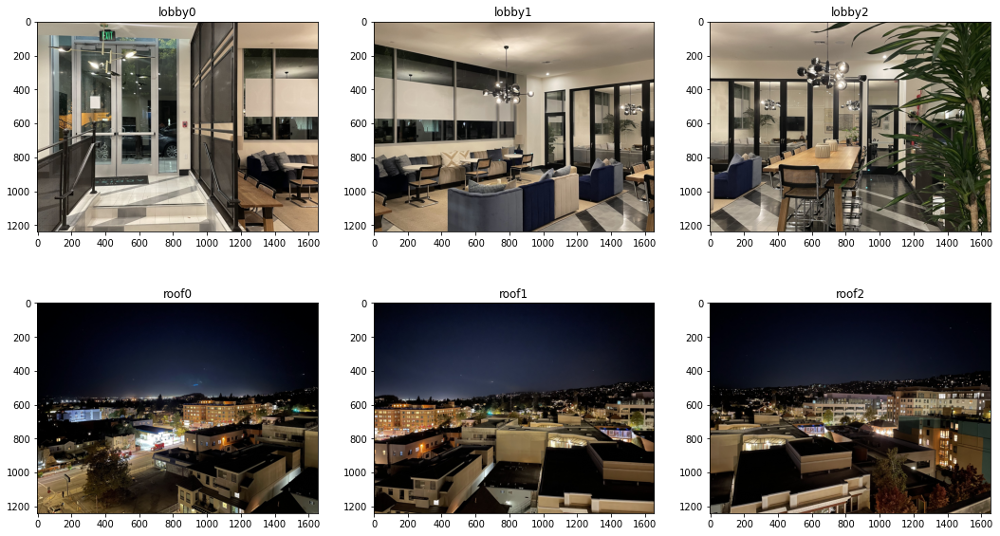

In [14]:
display_grid_of_images([lobbypics, roofpics], [['lobby0','lobby1','lobby2'],['roof0','roof1','roof2']], w = 6, h = 5, normalize_rgb = False)

- mosaic 0: lobby0 -> lobby1
- mosaic 1: lobby2 -> lobby1
- mosaic 2: roof0 -> roof1
- mosaic 3: roof2 -> roof1

### My own implementation of harris corner (wasted effort)

In [12]:
# img_blurred = gaussian_filter(img, 2)

In [13]:
# gaussian_sigma = 3

In [14]:
# ix = (np.roll(img_blurred, -1, 1) - np.roll(img_blurred, 1, 1))/2
# iy = (np.roll(img_blurred, -1, 0) - np.roll(img_blurred, 1, 0))/2
# ix = (np.roll(img, -1, 1) - np.roll(img, 1, 1))/2
# iy = (np.roll(img, -1, 0) - np.roll(img, 1, 0))/2

In [15]:
# display_dictionary_of_images({'ix': ix, 'iy': iy}, horiz = True, w = 6, h = 5, normalize_rgb = True)

In [16]:
# ix2, iy2, ixiy = ix * ix, iy * iy, ix * iy

In [17]:
# window = np.ones((windowsize, windowsize))

In [18]:
# ix2_window = convolve2d(ix2, window, mode = 'same')
# iy2_window = convolve2d(iy2, window, mode = 'same')
# ixiy_window = convolve2d(ixiy, window, mode = 'same')

In [19]:
# ix2_window = gaussian_filter(ix2, gaussian_sigma)
# iy2_window = gaussian_filter(iy2, gaussian_sigma)
# ixiy_window = gaussian_filter(ixiy, gaussian_sigma)

In [20]:
# m_rows = np.stack([ix2_window, ixiy_window], axis = 2), np.stack([ixiy_window, iy2_window], axis = 2)
# m = np.stack(m_rows, axis = 2)

In [21]:
# def get_R(M):
#     l1, l2 = np.linalg.eig(M)[0]
#     return (l1 * l2)/(l1 + l2)
# get_R = np.vectorize(get_R, signature = '(m,n)->()')

In [22]:
# start = time.time()
# R_array = get_R(m)
# print(f"time: {time.time() - start}")

In [23]:
def overlay_in_red(overlay, orig_bw):
    img_3channel = np.stack([orig_bw]*3, axis = 2)
    r_red =np.stack((overlay, np.zeros(overlay.shape), np.zeros(overlay.shape)), axis = 2)
    r_red = r_red/np.max(r_red)
    return r_red * 3 + img_3channel

In [24]:
### Find local maxima

# def get_local_maxes(arr):
    
#     rr = arr - np.roll(arr, -1, 1)
#     ll = arr - np.roll(arr, 1, 1)
#     tt = arr - np.roll(arr, 1, 0)
#     bb = arr - np.roll(arr, -1, 0)
#     tr = arr - np.roll(arr, [1, -1], [0, 1])
#     tl = arr - np.roll(arr, [1, 1], [0, 1])
#     br = arr - np.roll(arr, [-1, -1], [0, 1])
#     bl = arr - np.roll(arr, [-1, 1], [0, 1])
    
#     still_possible = np.ones(arr.shape)
    
#     for diff in [rr, ll, tt, bb, tr, tl, br, bl]:
#         still_possible = still_possible * diff
#         # eliminate negatives
#         still_possible = np.maximum(still_possible, 0)
    
#     still_possible[still_possible != 0] = 1
#     return still_possible

In [25]:
# R_thresholded = np.copy(R_array)
# R_thresholded[R_thresholded < 0.001] = 0


In [26]:
# display_dictionary_of_images({'response function in red': overlay_in_red(R_thresholded, img)}, w = 15, h = 10, normalize_rgb = True)

In [27]:
# all_points = get_local_maxes(R_thresholded)
# np.count_nonzero(all_points)

### end wasted effort

In [15]:
def get_harris_corners(im, edge_discard=20):
    """
    This function takes a b&w image and an optional amount to discard
    on the edge (default is 5 pixels), and finds all harris corners
    in the image. Harris corners near the edge are discarded and the
    coordinates of the remaining corners are returned. A 2d array (h)
    containing the h value of every pixel is also returned.

    h is the same shape as the original image, im.
    coords is 2 x n (ys, xs).
    """

    assert edge_discard >= 20

    # find harris corners
    h = corner_harris(im, method='eps', sigma=1)
    coords = peak_local_max(h, min_distance=5, indices=True)

    # discard points on edge
    edge = edge_discard  # pixels
    mask = (coords[:, 0] > edge) & \
           (coords[:, 0] < im.shape[0] - edge) & \
           (coords[:, 1] > edge) & \
           (coords[:, 1] < im.shape[1] - edge)
    coords = coords[mask].T
    return h, coords


In [16]:
def dist2(x, c):
    """
    dist2  Calculates squared distance between two sets of points.

    Description
    D = DIST2(X, C) takes two matrices of vectors and calculates the
    squared Euclidean distance between them.  Both matrices must be of
    the same column dimension.  If X has M rows and N columns, and C has
    L rows and N columns, then the result has M rows and L columns.  The
    I, Jth entry is the  squared distance from the Ith row of X to the
    Jth row of C.

    Adapted from code by Christopher M Bishop and Ian T Nabney.
    """
    
    ndata, dimx = x.shape
    ncenters, dimc = c.shape
    assert dimx == dimc, 'Data dimension does not match dimension of centers'

    return (np.ones((ncenters, 1)) * np.sum((x**2).T, axis=0)).T + \
            np.ones((   ndata, 1)) * np.sum((c**2).T, axis=0)    - \
            2 * np.inner(x, c)

# Step 1: ANMS

In [17]:
def corners_with_anms(img, C_ROBUST = 0.9, NUM_POINTS_ANMS = 500):
    
    
    def get_ri_for_point(points, f_array, point_idx):

        def is_valid_xj(idx_xi, idx_xj):
            if idx_xi == idx_xj:
                return False
            ix, iy = points[idx_xi]
            jx, jy = points[idx_xj]
            return f_array[ix, iy] < C_ROBUST * f_array[jx, jy]

        dists = dist2(points, points[point_idx].reshape((1,2)))
        dists = dists.flatten()

        dists_filtered = [val for idx, val in enumerate(dists) if is_valid_xj(point_idx, idx)]
        if len(dists_filtered) == 0:
            return float('+inf')
        return min(dists_filtered)

    
    
    corners = get_harris_corners(img)
    
    f_array = corners[0]
    points = corners[1].T
    
    start = time.time()
    ri_list = []
    for i in range(len(points)):
        ri_list.append(get_ri_for_point(points, f_array, i))
        if i % 1000 == 0 and i > 0:
            print(f"1000 iterations takes {time.time() - start}")
            start = time.time()


    points_with_ri_tuples = [[points[i, 0], points[i, 1], ri_list[i]] for i in range(len(points))]

    points_with_ri_tuples.sort(reverse = True, key = lambda x: x[2])

    points_anms = np.array(points_with_ri_tuples)[:NUM_POINTS_ANMS,:2].astype(int)

    return points, points_anms

In [18]:
lobby0_anms_pts = corners_with_anms(np.mean(lobbypics[0], axis = 2), C_ROBUST = 0.9, NUM_POINTS_ANMS = 500)[1]



lobby1_anms_pts = corners_with_anms(np.mean(lobbypics[1], axis = 2), C_ROBUST = 0.9, NUM_POINTS_ANMS = 500)[1]
lobby2_anms_pts = corners_with_anms(np.mean(lobbypics[2], axis = 2), C_ROBUST = 0.9, NUM_POINTS_ANMS = 500)[1]


roof0_anms_pts = corners_with_anms(np.mean(roofpics[0], axis = 2), C_ROBUST = 0.9, NUM_POINTS_ANMS = 500)[1]
roof1_anms_pts = corners_with_anms(np.mean(roofpics[1], axis = 2), C_ROBUST = 0.9, NUM_POINTS_ANMS = 500)[1]
roof2_anms_pts = corners_with_anms(np.mean(roofpics[2], axis = 2), C_ROBUST = 0.9, NUM_POINTS_ANMS = 500)[1]


In [20]:
pts_to_keep = 200
lobby0_anms_pts =lobby0_anms_pts[:pts_to_keep]
lobby1_anms_pts =lobby1_anms_pts[:pts_to_keep]
lobby2_anms_pts =lobby2_anms_pts[:pts_to_keep]
roof0_anms_pts  =roof0_anms_pts[:pts_to_keep]
roof1_anms_pts =roof1_anms_pts[:pts_to_keep]
roof2_anms_pts =roof2_anms_pts[:pts_to_keep]



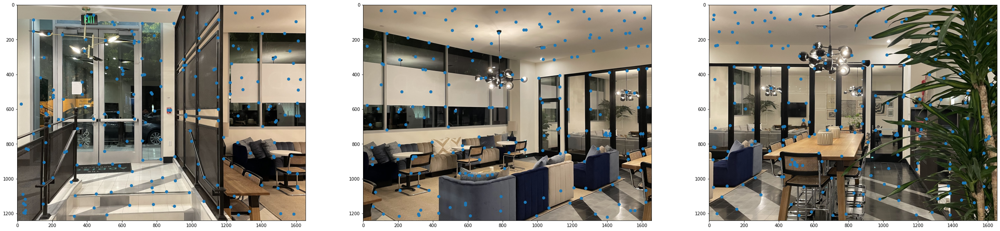

In [21]:
%matplotlib inline
fig = plt.figure(figsize=(40, 10))
subplots = fig.subplots(1, 3)
ax0, ax1, ax2 = subplots[0], subplots[1], subplots[2]
ax0.imshow(lobbypics[0])
ax1.imshow(lobbypics[1])
ax2.imshow(lobbypics[2])
ax0.scatter(*zip(*(lobby0_anms_pts[:200,::-1])))
ax1.scatter(*zip(*lobby1_anms_pts[:200,::-1]))
ax2.scatter(*zip(*lobby2_anms_pts[:200,::-1]))


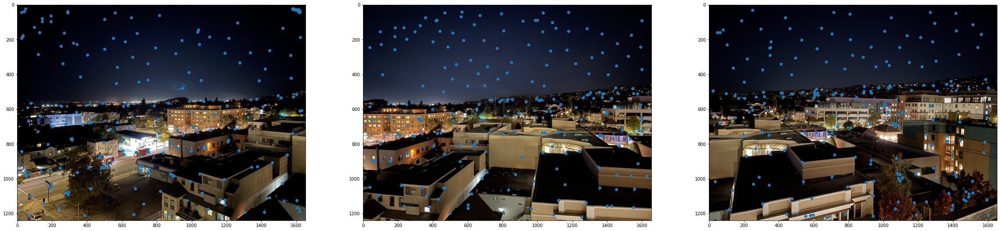

In [22]:
fig = plt.figure(figsize=(40, 10))
subplots = fig.subplots(1, 3)
ax0, ax1, ax2 = subplots[0], subplots[1], subplots[2]
ax0.imshow(roofpics[0])
ax1.imshow(roofpics[1])
ax2.imshow(roofpics[2])
ax0.scatter(*zip(*(roof0_anms_pts[:,::-1])))
ax1.scatter(*zip(*roof1_anms_pts[:,::-1]))
ax2.scatter(*zip(*roof2_anms_pts[:,::-1]))


# Step 2: Feature Extraction

In [23]:
def get_patches(img, pts):
    patches = []
    for i in range(len(pts)):
        pt_sample_r, pt_sample_c = pts[i]
        pt_sample = img[pt_sample_r - 20: pt_sample_r + 20, pt_sample_c - 20 : pt_sample_c + 20]
        pt_downsample = resize(pt_sample, (8,8), anti_aliasing=True)
        mu, sigma = np.mean(pt_downsample), np.std(pt_downsample)
        sample_normalized = (pt_downsample - mu)/sigma
        patches.append(sample_normalized)
    return np.array(patches)

In [24]:
patches_l0 = get_patches(np.mean(lobbypics[0], axis = 2), lobby0_anms_pts)
patches_l1 = get_patches(np.mean(lobbypics[1], axis = 2), lobby1_anms_pts)
patches_l2 = get_patches(np.mean(lobbypics[2], axis = 2), lobby2_anms_pts)

In [25]:
patches_r0 = get_patches(np.mean(roofpics[0], axis = 2), roof0_anms_pts)
patches_r1 = get_patches(np.mean(roofpics[1], axis = 2), roof1_anms_pts)
patches_r2 = get_patches(np.mean(roofpics[2], axis = 2), roof2_anms_pts)

In [26]:
def add_best_and_ratio_to_pts(patches_src, patches_dest, pts_src, pts_dest, THRESHOLD = 0.5):
    src_num = len(patches_src)
    dest_num = len(patches_dest)
    out = []
    for i in range(src_num):
        this_patch = patches_src[i]
        this_pts = pts_src[i]
        diffs = [np.sum((this_patch-patches_dest[j])**2) for j in range(dest_num)]
        
        bestval = min(diffs)
        argmin = diffs.index(bestval)
        
        diffs[argmin] = 9999999999
        nextbest = min(diffs)
        ratio = bestval/nextbest
        
        if ratio < THRESHOLD:
            
            out.append([this_pts[0], this_pts[1], *pts_dest[argmin]])
    
    return np.array(out)
        
        

In [27]:
lobby01_first_matching = add_best_and_ratio_to_pts(patches_l0, patches_l1, lobby0_anms_pts, lobby1_anms_pts)
lobby21_first_matching = add_best_and_ratio_to_pts(patches_l2, patches_l1, lobby2_anms_pts, lobby1_anms_pts)
roof01_first_matching = add_best_and_ratio_to_pts(patches_r0, patches_r1, roof0_anms_pts, roof1_anms_pts)
roof21_first_matching = add_best_and_ratio_to_pts(patches_r2, patches_r1, roof2_anms_pts, roof1_anms_pts)

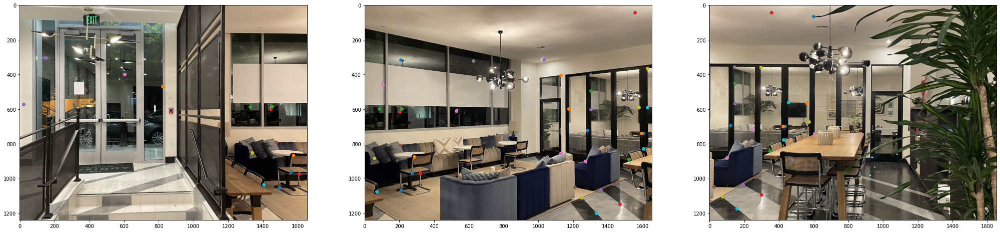

In [28]:
%matplotlib inline
fig = plt.figure(figsize=(35, 10))
ax0, ax1, ax2 = fig.subplots(1, 3)
ax0.imshow(lobbypics[0])
ax1.imshow(lobbypics[1])
ax2.imshow(lobbypics[2])

color = 0
for val in lobby01_first_matching:
    ax0.scatter(val[1], val[0], color = f"C{color}")
    ax1.scatter(val[3], val[2], color = f"C{color}")
    color += 1

for val in lobby21_first_matching:
    ax2.scatter(val[1], val[0], color = f"C{color}")
    ax1.scatter(val[3], val[2], color = f"C{color}")
    color += 1


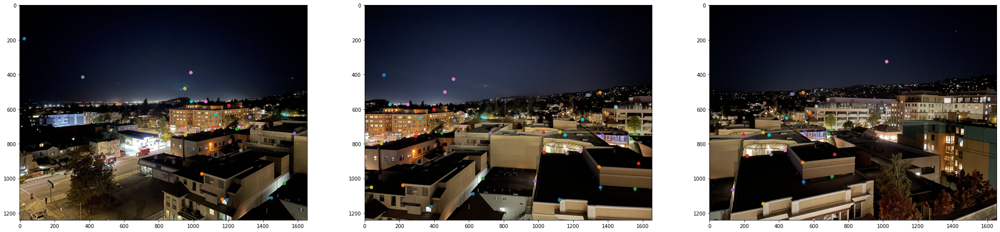

In [29]:
%matplotlib inline
fig = plt.figure(figsize=(35, 10))
ax0, ax1, ax2 = fig.subplots(1, 3)
ax0.imshow(roofpics[0])
ax1.imshow(roofpics[1])
ax2.imshow(roofpics[2])

color = 0
for val in roof01_first_matching:
    ax0.scatter(val[1], val[0], color = f"C{color}")
    ax1.scatter(val[3], val[2], color = f"C{color}")
    color += 1

for val in roof21_first_matching:
    ax2.scatter(val[1], val[0], color = f"C{color}")
    ax1.scatter(val[3], val[2], color = f"C{color}")
    color += 1


# Step 3: RANSAC

In [30]:
def compute_H(src_pts, dst_pts, lstsq = True):
    
    def get_A_components(idx):
        x, y = src_pts[idx]
        xp,yp = dst_pts[idx]
        
        list1 = [x, y, 1, 0, 0, 0, -1*xp*x, -1*xp*y]
        list2 = [0, 0, 0, x, y, 1, -1*yp*x, -1*yp*y]
        return np.array([list1, list2])

    def get_b_components(idx):
        xp, yp = dst_pts[idx]
        return np.array([xp, yp]).reshape((2,1))
    
    assert len(src_pts) == len(dst_pts)
    n = len(src_pts)
    
    A = np.vstack([get_A_components(idx) for idx in range(n)])
    b = np.vstack([get_b_components(idx) for idx in range(n)])
    
    if lstsq:
        h = np.linalg.lstsq(A, b)[0].flatten()
    else:
        h = np.linalg.solve(A, b).flatten()
    a,b,c,d,e,f,g,h = h
    
    H = np.array([[a,b,c],[d,e,f],[g,h,1]])
    
    return H

In [31]:
def ransac(point_pairs, num_iters):
    def find_inliers(src_pts, dst_pts):
        test_H = compute_H(src_pts[:,::-1], dst_pts[:,::-1], False)
        inliers = []
        for idx, val in enumerate(point_pairs):

            orig = np.array([val[1],val[0],1])
            should_be = np.array([val[3],val[2]])

            result_of_H = orig @ test_H.T
            result_of_H /= result_of_H[2]
            result_of_H = result_of_H[:2]
            # print('hh')
            # print(should_be)
            # print(result_of_H)
            if np.sum((should_be - result_of_H)**2) <= 8:
                inliers.append(idx)
        return inliers
    max_inliers = 0
    best_set = None
    for i in range(num_iters):
        L = len(point_pairs)
        rand = random.sample(range(0, L), 4)
        src_pts = point_pairs[rand,:2]
        dst_pts = point_pairs[rand,2:]

        inliers = find_inliers(src_pts, dst_pts)
        if len(inliers) > 4:
            if len(inliers) > max_inliers:
                max_inliers = len(inliers)
                best_set = inliers
    if max_inliers <= 4:
        print('ransac couldnt find any sets')
        return None
    return best_set

In [32]:
def ransac_and_do_points(points):
    point_indices = ransac(points, 2000)
    if not point_indices:
        return None
    points_after_ransac = points[point_indices]
    src_pts = points_after_ransac[:,:2]
    dst_pts = points_after_ransac[:,2:]
    src_pts = src_pts[:,::-1]
    dst_pts = dst_pts[:,::-1]
    
    return src_pts, dst_pts
        

# All above: points have [row, col] format
# All below: points have [x,y] format

In [33]:
lobby01_pts, lobby10_pts = ransac_and_do_points(lobby01_first_matching)
lobby21_pts, lobby12_pts = ransac_and_do_points(lobby21_first_matching)
roof01_pts, roof10_pts = ransac_and_do_points(roof01_first_matching)
roof21_pts, roof12_pts = ransac_and_do_points(roof21_first_matching)

C:\Users\jerry\AppData\Local\Temp/ipykernel_18264/2047005317.py:11: RuntimeWarning: divide by zero encountered in true_divide
  result_of_H /= result_of_H[2]
C:\Users\jerry\AppData\Local\Temp/ipykernel_18264/2047005317.py:11: RuntimeWarning: invalid value encountered in true_divide
  result_of_H /= result_of_H[2]


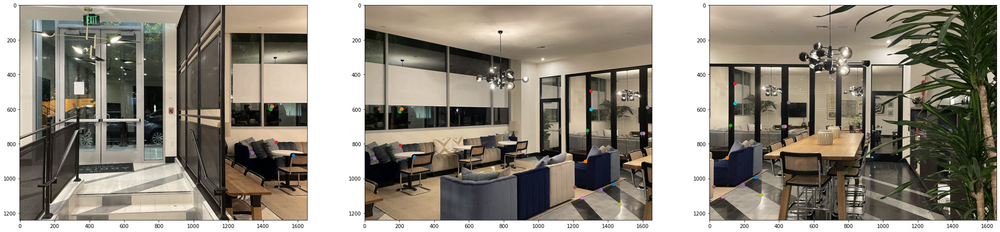

In [34]:
%matplotlib inline
fig = plt.figure(figsize=(35, 10))
ax0, ax1, ax2 = fig.subplots(1, 3)
ax0.imshow(lobbypics[0])
ax1.imshow(lobbypics[1])
ax2.imshow(lobbypics[2])

color = 0
for i in range(len(lobby01_pts)):
    ax0.scatter(*lobby01_pts[i], color = f"C{color}")
    ax1.scatter(*lobby10_pts[i], color = f"C{color}")
    color += 1

for i in range(len(lobby21_pts)):
    ax2.scatter(*lobby21_pts[i], color = f"C{color}")
    ax1.scatter(*lobby12_pts[i], color = f"C{color}")
    color += 1


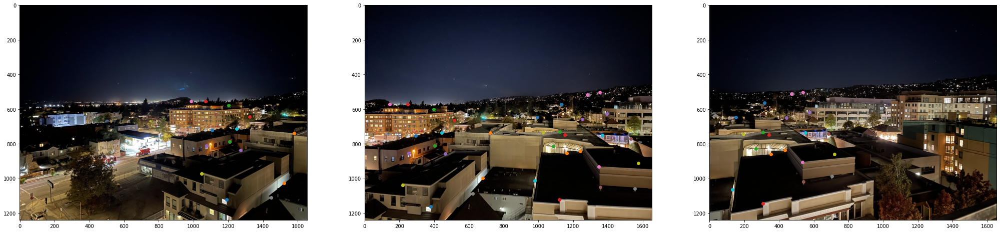

In [35]:
%matplotlib inline
fig = plt.figure(figsize=(35, 10))
ax0, ax1, ax2 = fig.subplots(1, 3)
ax0.imshow(roofpics[0])
ax1.imshow(roofpics[1])
ax2.imshow(roofpics[2])

color = 0
for i in range(len(roof01_pts)):
    ax0.scatter(*roof01_pts[i], color = f"C{color}")
    ax1.scatter(*roof10_pts[i], color = f"C{color}")
    color += 1

for i in range(len(roof21_pts)):
    ax2.scatter(*roof21_pts[i], color = f"C{color}")
    ax1.scatter(*roof12_pts[i], color = f"C{color}")
    color += 1


# Code below is copied from part 1

In [36]:
def normalize(arr):
    ws = arr[:,2].reshape(len(arr), 1)
    return (arr/ws)[:,:2]

def new_canvas_ranges(orig_img, H):
    h, w = orig_img.shape[:2]
    topleft_o = np.array([0,0,1])
    topright_o = np.array([w,0,1])
    botleft_o = np.array([0,h,1])
    botright_o = np.array([w,h,1])
    
    topleft_n = topleft_o @ H.T
    topleft_n /= topleft_n[2]
    
    
    topright_n = topright_o @ H.T
    topright_n /= topright_n[2]
    
    botleft_n = botleft_o @ H.T
    botleft_n /= botleft_n[2]
    
    botright_n = botright_o @ H.T
    botright_n /= botright_n[2]
    
    max_x = math.ceil(max(topright_n[0], botright_n[0]))
    min_x = math.floor(min(topleft_n[0], botleft_n[0]))
    width = max_x - min_x
    
    max_y = math.ceil(max(botleft_n[1], botright_n[1]))
    min_y = math.floor(min(topleft_n[1], topright_n[1]))
    
    height = max_y - min_y
    
    return np.arange(min_x, max_x, 1), np.arange(min_y, max_y, 1), np.array([height, width])

def warp_image(orig_img, H, method):
    
    
    
    def convert_to_list_of_coords(xs, ys):
        gridx, gridy = np.meshgrid(xs, ys)
        stacked = np.stack((gridx, gridy, np.ones(gridx.shape)), axis = 2)
        flat_stax = stacked.reshape((gridx.size, 3))
        return flat_stax
        
    
    H_inv = np.linalg.inv(H)
    
    new_xrange, new_yrange, new_shape = new_canvas_ranges(orig_img, H)
    new_coords = convert_to_list_of_coords(new_xrange, new_yrange)
    
    inv_warp_x, inv_warp_y = normalize(new_coords @ H_inv.T).T
    
    old_coords = convert_to_list_of_coords(np.arange(0, orig_img.shape[1], 1), np.arange(0,orig_img.shape[0],1))
    old_xs, old_ys, _ = old_coords.T
    
    
    
    list_of_colors = []
    # iterate through the colors
    for c in range(orig_img.shape[2]):
        this_color = interpolate.griddata((old_xs, old_ys), orig_img[:,:,c].flatten(), (inv_warp_x, inv_warp_y), method=method, fill_value=0)
        print(f"done with color {c}")
        list_of_colors.append(this_color.reshape(new_shape))
    
    return np.stack(list_of_colors, axis = 2), new_xrange[0], new_yrange[0]
    

def warp_image_and_get_midpoints(orig_img, src_pts, dst_pts, method = 'nearest'):
    H = compute_H(src_pts, dst_pts)
    midpoint_orig = np.hstack((np.mean(src_pts, axis=0), [1]))
    midpoint_warped = midpoint_orig @ H.T
    midpoint_warped /= midpoint_warped[2]
    
    midpoint_dest = np.mean(dst_pts, axis=0)
    
    warped, img_start_x, img_start_y = warp_image(orig_img, H, method)
    
    top_left_corner = np.array([img_start_x, img_start_y])
    midpoint_warped = midpoint_warped[:2] - top_left_corner
    
    return warped, midpoint_warped, midpoint_dest

def color_gaussian(color_image, sigma):
    r, g, b = color_image[:,:,0], color_image[:,:,1], color_image[:,:,2]
    out = []
    for color in (r, g, b):
        start = time.time()
        out.append(gaussian_filter(color, sigma=sigma))
        print(f"one color took {time.time() - start}")
    return np.stack(out, axis = 2)
def get_alpha(shape, start, end):
    width = shape[1]
    slope = 1./(end - start)
    row = np.zeros(width).astype(float)
    row[start:end] = np.linspace(0, 1, end - start)
    row[end:] = 1
    
    two_d = np.vstack([row]*shape[0])
    
    return np.stack([two_d, two_d, two_d], axis = 2)

## Make mosaic from the lobby pictures

In [37]:
warped01, point01, point10 = warp_image_and_get_midpoints(lobbypics[0], lobby01_pts, lobby10_pts)
warped21, point21, point12 = warp_image_and_get_midpoints(lobbypics[2], lobby21_pts, lobby12_pts)

C:\Users\jerry\AppData\Local\Temp/ipykernel_18264/1516587445.py:22: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, b)[0].flatten()


done with color 0
done with color 1
done with color 2
done with color 0
done with color 1
done with color 2


In [38]:
point01 = point01.astype(int)
point10 = point10.astype(int)
point21 = point21.astype(int)
point12 = point12.astype(int)

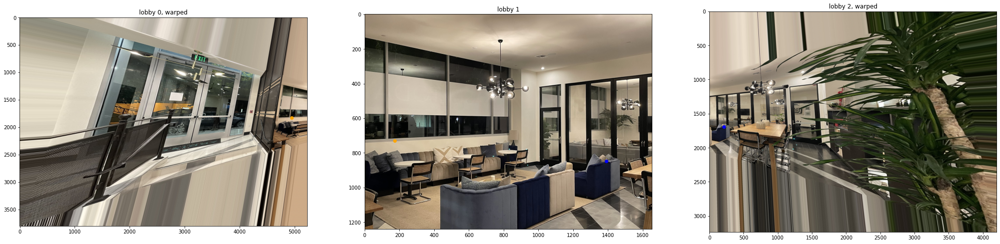

In [39]:
%matplotlib inline
fig = plt.figure(figsize=(35, 12))
subplots = fig.subplots(1, 3)
ax0, ax1, ax2 = subplots[0], subplots[1], subplots[2]

ax0.set_title('lobby 0, warped')
ax1.set_title('lobby 1')
ax2.set_title('lobby 2, warped')

ax0.imshow(warped01)
ax1.imshow(lobbypics[1])
ax2.imshow(warped21)

ax0.scatter(*point01, color = 'orange')
ax1.scatter(*point10, color = 'orange')
ax1.scatter(*point12, color = 'blue')
ax2.scatter(*point21, color = 'blue')

### Getting the total width and height of final image

We'll use point10 (the orange point in the middle image) as an anchor.

In [40]:
width_leftof_point10 = max(point01[0], point21[0] - (point12[0] - point10[0]))
width_rightof_point10 = max(warped01.shape[1] - point01[0], (warped21.shape[1] - point21[0]) + (point12[0] - point10[0]))
total_width = width_leftof_point10 + width_rightof_point10
total_width

10152

In [41]:
height_above_point10 = max(point01[1], point21[1] - (point12[1] - point10[1]))
height_below_point10 = max(warped01.shape[0] - point01[1], (warped21.shape[0] - point21[1]) + (point12[1] - point10[1]))
total_height = height_above_point10 + height_below_point10
print(total_height)

3801


### Pasting the 3 images in the correct position
again using point10 as an anchor.

In [42]:
point10_final_xy = np.array([width_leftof_point10, height_above_point10])
point12_final_xy = point10_final_xy + point12 - point10

In [43]:
positioned_img0 = np.zeros((total_height, total_width, 3))
positioned_img1 = np.zeros((total_height, total_width, 3))
positioned_img2 = np.zeros((total_height, total_width, 3))

topleft_0_xy = point10_final_xy - point01
botright_0_xy = topleft_0_xy + np.array([warped01.shape[1], warped01.shape[0]])

topleft_1_xy = point10_final_xy - point10
botright_1_xy = topleft_1_xy + np.array([lobbypics[1].shape[1], lobbypics[1].shape[0]])

topleft_2_xy = point12_final_xy - point21
botright_2_xy = topleft_2_xy + np.array([warped21.shape[1], warped21.shape[0]])

In [44]:
positioned_img0[topleft_0_xy[1]:botright_0_xy[1], topleft_0_xy[0]:botright_0_xy[0]] = warped01
positioned_img1[topleft_1_xy[1]:botright_1_xy[1], topleft_1_xy[0]:botright_1_xy[0]] = lobbypics[1]
positioned_img2[topleft_2_xy[1]:botright_2_xy[1], topleft_2_xy[0]:botright_2_xy[0]] = warped21

In [46]:
# np.save('cache_lobby/positioned_img0.npy', positioned_img0)
# np.save('cache_lobby/positioned_img1.npy', positioned_img1)
# np.save('cache_lobby/positioned_img2.npy', positioned_img2)
# positioned_img0 = np.load('cache_lobby/positioned_img0.npy')
# positioned_img1 = np.load('cache_lobby/positioned_img1.npy')
# positioned_img2 = np.load('cache_lobby/positioned_img2.npy')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


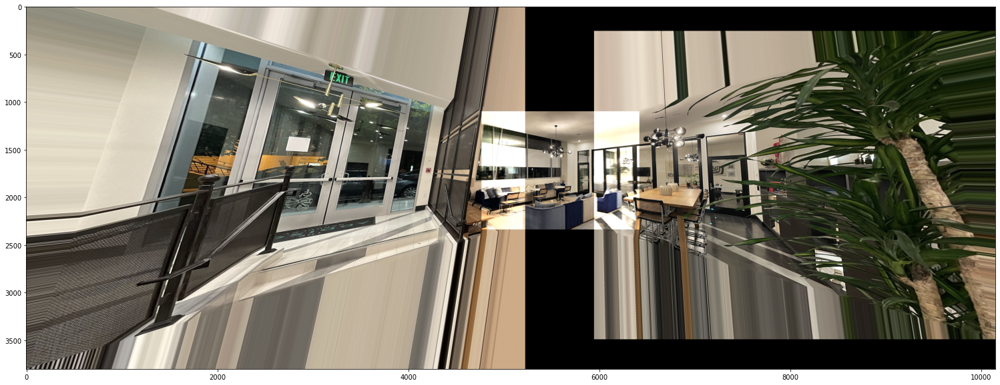

In [47]:
plt.figure(figsize=(35, 10))
plt.imshow(positioned_img0 + positioned_img1 + positioned_img2)

### Seperate low and high frequencies

In [48]:
positioned_img0_b, positioned_img1_b, positioned_img2_b = [color_gaussian(img, sigma=20) for img in [positioned_img0, positioned_img1, positioned_img2]]

one color took 5.68181037902832
one color took 5.607012510299683
one color took 5.539191722869873
one color took 5.6369309425354
one color took 5.533208847045898
one color took 5.557412147521973
one color took 5.586912631988525
one color took 5.56740403175354
one color took 5.55116081237793


In [49]:
positioned_img0_s = positioned_img0 - positioned_img0_b
positioned_img1_s = positioned_img1 - positioned_img1_b
positioned_img2_s = positioned_img2 - positioned_img2_b

### Blend using weighted averaging for low freq, hard border for high freq

In [50]:
alpha_01_b = get_alpha([total_height, total_width], topleft_1_xy[0], botright_0_xy[0])
alpha_12_b = get_alpha([total_height, total_width], topleft_2_xy[0], botright_1_xy[0])
alpha_01_s = get_alpha([total_height, total_width], topleft_1_xy[0]+100, topleft_1_xy[0] + 101)
alpha_12_s = get_alpha([total_height, total_width], topleft_2_xy[0]+100, topleft_2_xy[0] + 101)

In [51]:
blended_lobby_blurs = (positioned_img0_b * (1 - alpha_01_b) + \
                     positioned_img1_b * alpha_01_b * (1 - alpha_12_b) + \
                     positioned_img2_b * alpha_12_b)

In [52]:
blended_lobby_sharps = (positioned_img0_s * (1 - alpha_01_s) + \
                     positioned_img1_s * alpha_01_s * (1 - alpha_12_s) + \
                     positioned_img2_s * alpha_12_s)

In [53]:
combined_lobby = blended_lobby_blurs + blended_lobby_sharps
combined_lobby = np.clip(combined_lobby, 0, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


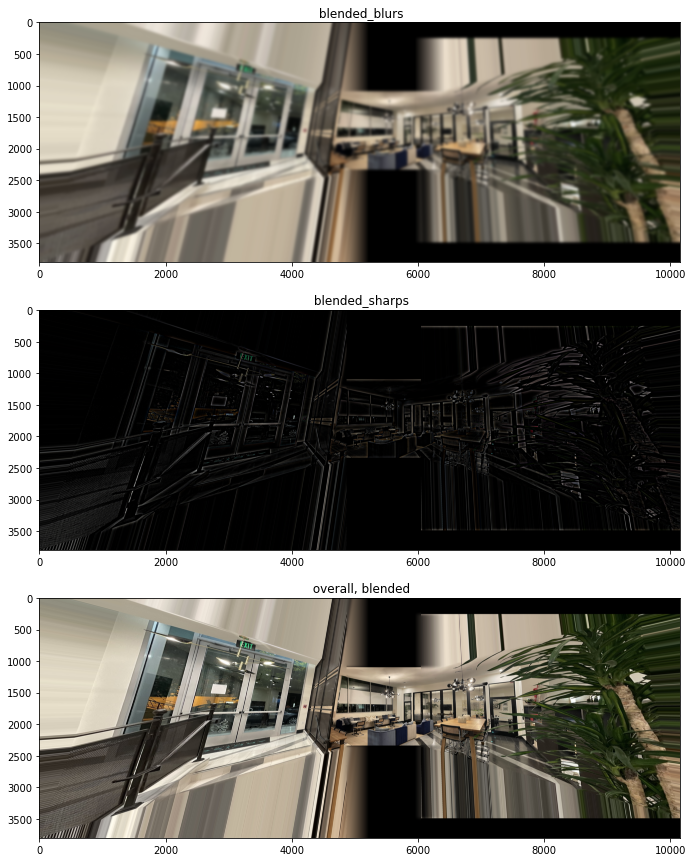

In [54]:
display_dictionary_of_images({'blended_blurs': blended_lobby_blurs, 'blended_sharps': blended_lobby_sharps, 'overall, blended':combined_lobby}, w = 15, h = 5)

In [56]:
skio.imsave(f"data_auto/lobby_combined.jpg", combined_lobby*255)

Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


## Make mosaic from the roof pictures

In [57]:
warped01, point01, point10 = warp_image_and_get_midpoints(roofpics[0], roof01_pts, roof10_pts)
warped21, point21, point12 = warp_image_and_get_midpoints(roofpics[2], roof21_pts, roof12_pts)

C:\Users\jerry\AppData\Local\Temp/ipykernel_18264/1516587445.py:22: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  h = np.linalg.lstsq(A, b)[0].flatten()


done with color 0
done with color 1
done with color 2
done with color 0
done with color 1
done with color 2


In [58]:
point01 = point01.astype(int)
point10 = point10.astype(int)
point21 = point21.astype(int)
point12 = point12.astype(int)

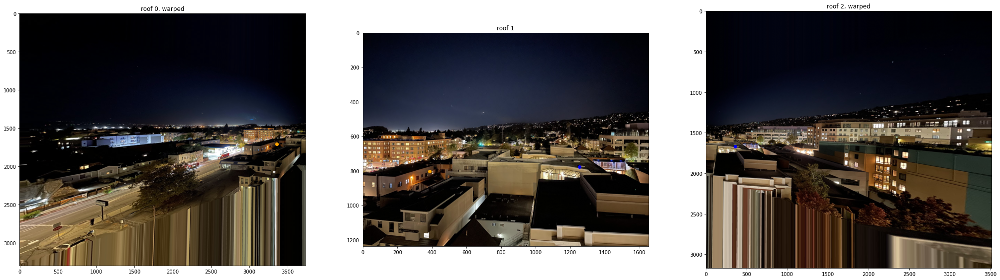

In [59]:
%matplotlib inline
fig = plt.figure(figsize=(35, 12))
subplots = fig.subplots(1, 3)
ax0, ax1, ax2 = subplots[0], subplots[1], subplots[2]

ax0.set_title('roof 0, warped')
ax1.set_title('roof 1')
ax2.set_title('roof 2, warped')

ax0.imshow(warped01)
ax1.imshow(roofpics[1])
ax2.imshow(warped21)

ax0.scatter(*point01, color = 'orange')
ax1.scatter(*point10, color = 'orange')
ax1.scatter(*point12, color = 'blue')
ax2.scatter(*point21, color = 'blue')

### Getting the total width and height of final image

We'll use point10 (the orange point in the middle image) as an anchor.

In [60]:
width_leftof_point10 = max(point01[0], point21[0] - (point12[0] - point10[0]))
width_rightof_point10 = max(warped01.shape[1] - point01[0], (warped21.shape[1] - point21[0]) + (point12[0] - point10[0]))
total_width = width_leftof_point10 + width_rightof_point10
total_width

7382

In [61]:
height_above_point10 = max(point01[1], point21[1] - (point12[1] - point10[1]))
height_below_point10 = max(warped01.shape[0] - point01[1], (warped21.shape[0] - point21[1]) + (point12[1] - point10[1]))
total_height = height_above_point10 + height_below_point10
print(total_height)

3299


### Pasting the 3 images in the correct position
again using point10 as an anchor.

In [62]:
point10_final_xy = np.array([width_leftof_point10, height_above_point10])
point12_final_xy = point10_final_xy + point12 - point10

In [63]:
positioned_img0 = np.zeros((total_height, total_width, 3))
positioned_img1 = np.zeros((total_height, total_width, 3))
positioned_img2 = np.zeros((total_height, total_width, 3))

topleft_0_xy = point10_final_xy - point01
botright_0_xy = topleft_0_xy + np.array([warped01.shape[1], warped01.shape[0]])

topleft_1_xy = point10_final_xy - point10
botright_1_xy = topleft_1_xy + np.array([roofpics[1].shape[1], roofpics[1].shape[0]])

topleft_2_xy = point12_final_xy - point21
botright_2_xy = topleft_2_xy + np.array([warped21.shape[1], warped21.shape[0]])

In [64]:
positioned_img0[topleft_0_xy[1]:botright_0_xy[1], topleft_0_xy[0]:botright_0_xy[0]] = warped01
positioned_img1[topleft_1_xy[1]:botright_1_xy[1], topleft_1_xy[0]:botright_1_xy[0]] = roofpics[1]
positioned_img2[topleft_2_xy[1]:botright_2_xy[1], topleft_2_xy[0]:botright_2_xy[0]] = warped21

In [65]:
np.save('cache_roof/positioned_img0.npy', positioned_img0)
np.save('cache_roof/positioned_img1.npy', positioned_img1)
np.save('cache_roof/positioned_img2.npy', positioned_img2)
# positioned_img0 = np.load('cache_roof/positioned_img0.npy')
# positioned_img1 = np.load('cache_roof/positioned_img1.npy')
# positioned_img2 = np.load('cache_roof/positioned_img2.npy')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


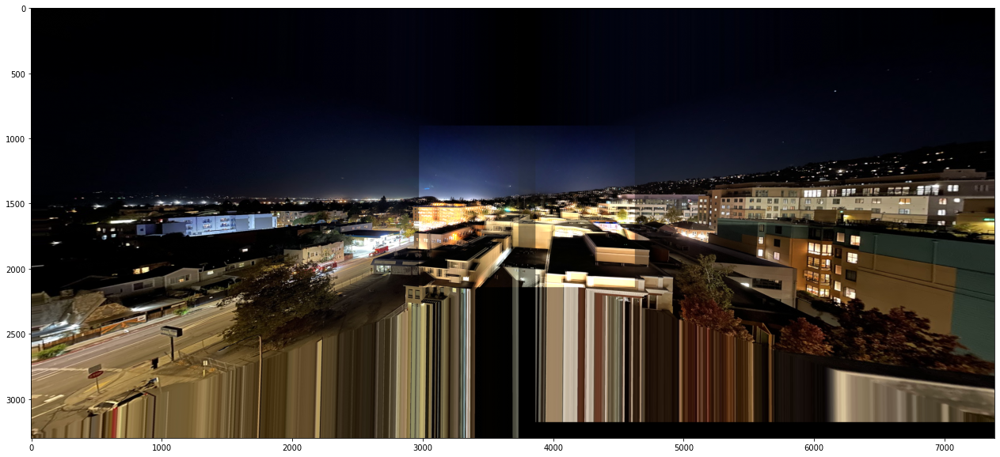

In [66]:
plt.figure(figsize=(35, 10))
plt.imshow(positioned_img0 + positioned_img1 + positioned_img2)

### Seperate low and high frequencies

In [67]:
positioned_img0_b, positioned_img1_b, positioned_img2_b = [color_gaussian(img, sigma=20) for img in [positioned_img0, positioned_img1, positioned_img2]]

one color took 3.489708662033081
one color took 3.4707159996032715
one color took 3.4737284183502197
one color took 3.4468159675598145
one color took 3.464747905731201
one color took 3.4776806831359863
one color took 3.468705654144287
one color took 3.4707512855529785
one color took 3.461728572845459


In [68]:
positioned_img0_s = positioned_img0 - positioned_img0_b
positioned_img1_s = positioned_img1 - positioned_img1_b
positioned_img2_s = positioned_img2 - positioned_img2_b

### Blend using weighted averaging for low freq, hard border for high freq

In [69]:
alpha_01_b = get_alpha([total_height, total_width], topleft_1_xy[0], botright_0_xy[0])
alpha_12_b = get_alpha([total_height, total_width], topleft_2_xy[0], botright_1_xy[0])
alpha_01_s = get_alpha([total_height, total_width], topleft_1_xy[0]+100, topleft_1_xy[0] + 101)
alpha_12_s = get_alpha([total_height, total_width], topleft_2_xy[0]+100, topleft_2_xy[0] + 101)

In [70]:
blended_roof_blurs = (positioned_img0_b * (1 - alpha_01_b) + \
                     positioned_img1_b * alpha_01_b * (1 - alpha_12_b) + \
                     positioned_img2_b * alpha_12_b)

In [71]:
blended_roof_sharps = (positioned_img0_s * (1 - alpha_01_s) + \
                     positioned_img1_s * alpha_01_s * (1 - alpha_12_s) + \
                     positioned_img2_s * alpha_12_s)

In [72]:
combined_roof = blended_roof_blurs + blended_roof_sharps
combined_roof = np.clip(combined_roof, 0, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


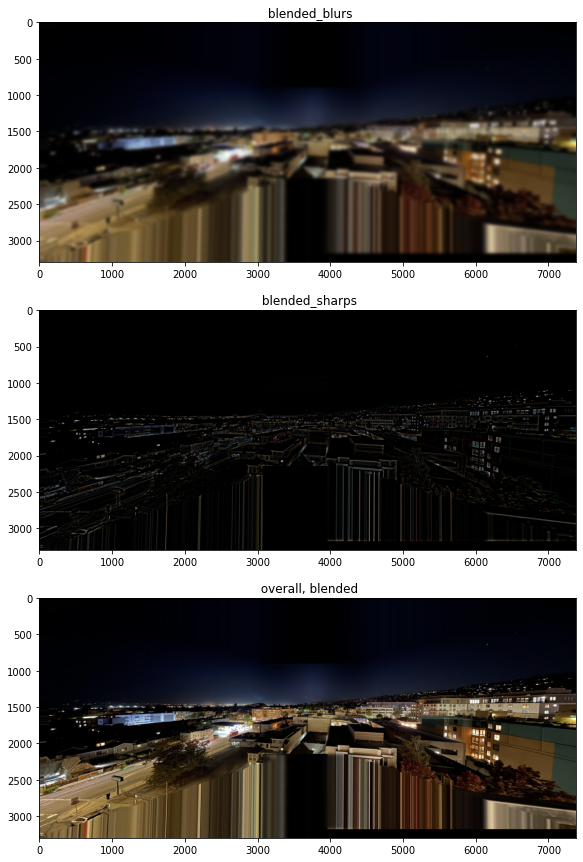

In [73]:
display_dictionary_of_images({'blended_blurs': blended_roof_blurs, 'blended_sharps': blended_roof_sharps, 'overall, blended':combined_roof}, w = 15, h = 5)

In [75]:
skio.imsave(f"data_auto/roof_combined.jpg", combined_roof*255)

Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.
